In [1]:
## IMPORTANT !

# In the first order need to set the number of CPU 
# for calculation before launching (depends on computer's number of cores)
n_jobs= 30

#libraries
import pandas as pd
import numpy as np
import os
import sys
import shutil
import glob
import joblib
import warnings
from datetime import date, datetime

from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import GroupKFold
from sklearn.model_selection import LeavePGroupsOut
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample

import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import pearsonr
import scipy.stats as st

from nilearn import image as nli
from nilearn import plotting

import copy

In [2]:
#@title Import functions
%matplotlib inline  
#!pip install brainspace --quiet
import ipywidgets as widgets  

# Interactive plots
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets # interactive display
my_layout = widgets.Layout()

import numpy as np
from brainspace.datasets import load_conte69
from brainspace.plotting import plot_hemispheres, plot_surf
from brainspace.utils.parcellation import map_to_labels
from brainspace.mesh import mesh_cluster
import panel as pn
pn.extension('vtk')
import os # OS to handle paths
import pandas as pd # pandas for data framse
import csv
import urllib.request as urllib2

import matplotlib.pyplot as plt # For changing the color maps
from matplotlib import cm # cm=colormap
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
# from hcp_regions import HCPRegions
import ipywidgets as widgets       # interactive display

from brainspace.datasets import load_fsa5
from nilearn import datasets
from brainspace.utils.parcellation import reduce_by_labels

##### Load data

In [3]:
#load path to orig tables
path='/media/hcs-psy-narun/Alina/HCP_YA/MLtables_cope/'

In [4]:
path_img_out = '/media/hcs-psy-narun/Alina/HCP_results/predicted_values_for_datasets_5/plots_article/plots_feat_hcpya/'

In [5]:
#load some features tables as dictionary
features = {
    'wm':pd.read_csv(path+'wm_table.csv', index_col=0),
    'surf':pd.read_csv(path+'surf_table.csv', index_col=0),
    'subc':pd.read_csv(path+'subc_table.csv', index_col=0),
    'VolBrain':pd.read_csv(path+'VolBrain_table.csv', index_col=0),
    
    'rest':pd.read_csv(path+'rest_hpass.csv', index_col=0), 

}

In [6]:
#load labels from orig tables
ind_task = features['wm'].columns.values
ind_anat = features['surf'].columns.values
ind_subc = features['subc'].columns.values
ind_bVol = features['VolBrain'].columns.values
ind_FC = features['rest'].columns.values

In [7]:
#path to ML outputs
nmf=path+'output_new_enh_newADJ_SHAP_newREST_CogTotalComp_Unadj'
path2 = nmf+'/'

#read number of folds
folders = sorted((os.listdir(path2)))[:1]
print(path2)
print(folders)

/media/hcs-psy-narun/Alina/HCP_YA/MLtables_cope/output_new_enh_newADJ_SHAP_newREST_CogTotalComp_Unadj/
['Fold_0']


##### Labels

In [8]:
#Labels
#labels for single modalities and stack
lblY = ['Total Brain Volume',
        'Cortical Thickness',
        'Emotion Processing Contrast',
        'Gambling Contrast',
        'Gambling FC',
        'Language Contrast',
        'Language FC',
        'Motor Contrast', 
        'Motor FC',
        'Relational Contrast',
        'Relational FC',
        'Resting State FC', 
        'Social Cognition Contrast',
        'Social Cognition FC',
        'Subcortical Volume',
        'Surface Area', 
        'Working Memory Contrast',
        'Working Memory FC',
        'Stacked: All', #1
        'Stacked: Task Contrast',         #2
        'Stacked: Non Task', #3
        'Stacked: Task FC',#4
        'Stacked: Task Contrast & Task FC',#5
        'Stacked: All excluding Task FC',#6
        'Stacked: All excluding Task Contrast',#7
        'Stacked: Resting and Task FC'] #8


#labels for single modalities within each stack
lbl_set1 = ['emo', 'gam', 'lan', 'mot', 'rel', 'soc', 'wm', 
            'gam_FC', 'lan_FC', 'mot_FC', 'rel_FC', 'soc_FC', 'wm_FC', 
            'cort', 'subc', 'surf', 'VolBrain', 'rest']

lbl_set2 = ['emo', 'gam', 'lan', 'mot', 'rel', 'soc', 'wm']
lbl_set3 = ['cort', 'subc', 'surf', 'rest', 'VolBrain']

lbl_set4 = ['gam_FC', 'lan_FC', 'mot_FC', 'rel_FC', 'soc_FC', 'wm_FC']
lbl_set5 = ['emo', 'gam', 'lan', 'mot', 'rel', 'soc', 'wm', 
            'gam_FC', 'lan_FC', 'mot_FC', 'rel_FC', 'soc_FC', 'wm_FC']
lbl_set6 = ['emo', 'gam', 'lan', 'mot', 'rel', 'soc', 'wm', 
            'cort', 'subc', 'surf', 'rest', 'VolBrain']
lbl_set7 = ['gam_FC', 'lan_FC', 'mot_FC', 'rel_FC', 'soc_FC', 'wm_FC', 
            'cort', 'subc', 'surf', 'rest', 'VolBrain']
lbl_set8 = ['gam_FC', 'lan_FC', 'mot_FC', 'rel_FC', 'soc_FC', 'wm_FC', 'rest']


##### Extract feature importance 

In [9]:
#extract feature importance from saved models
#for stack
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

dct_stack_coeff={} #empty dct to store 

nsets = ['set1', 'set2', 'set3', 'set4', 'set5', 'set6', 'set7', 'set8']
lblssets = [lbl_set1, lbl_set2, lbl_set3, lbl_set4, lbl_set5, lbl_set6, lbl_set7, lbl_set8]

for nset, lblsset in zip(nsets, lblssets):
    dct_ = {}
    #extracting feature importance for each fold and each stack model
    for fold in folders:
        dct_[fold] = (joblib.load(path2+fold+'/'+nset+'_stacked_model.sav')).named_steps['elasticnet'].coef_
    df = pd.DataFrame(dct_ , index=lblsset).T 
    #save as separate table
    df.to_csv(path2+nset+'_stacked_coeffs.csv') 
    #save to dictionary
    dct_stack_coeff[nset] = df

In [10]:
#print mean feature importance for each stack before plotting

for key in dct_stack_coeff.keys():
    print(key)
    display(dct_stack_coeff[key].mean().sort_values(ascending=False))
    print(' ')

set1


wm          0.184839
emo         0.168664
lan         0.132932
mot         0.120804
wm_FC       0.111912
rel         0.097105
surf        0.094052
soc_FC      0.080533
cort        0.065561
mot_FC      0.054937
lan_FC      0.030482
subc        0.027712
rel_FC      0.025299
soc         0.023569
gam_FC      0.004046
gam         0.000000
rest       -0.030685
VolBrain   -0.046715
dtype: float64

 
set2


wm     0.247792
emo    0.207603
lan    0.192746
mot    0.175863
rel    0.135042
soc    0.040734
gam    0.000000
dtype: float64

 
set3


rest        0.326310
surf        0.177323
cort        0.162568
subc        0.043974
VolBrain   -0.044564
dtype: float64

 
set4


wm_FC     0.244258
lan_FC    0.169805
soc_FC    0.147016
rel_FC    0.086605
mot_FC    0.074837
gam_FC    0.067951
dtype: float64

 
set5


wm        0.184332
emo       0.170265
lan       0.133802
wm_FC     0.121421
mot       0.119338
rel       0.102327
soc_FC    0.084291
mot_FC    0.062130
lan_FC    0.035187
rel_FC    0.033320
soc       0.019623
gam_FC    0.011472
gam       0.000000
dtype: float64

 
set6


wm          0.220928
emo         0.186184
lan         0.160023
mot         0.149487
surf        0.117420
rel         0.112284
cort        0.090772
rest        0.066597
soc         0.042217
subc        0.027509
gam         0.000000
VolBrain   -0.043392
dtype: float64

 
set7


wm_FC       0.223488
lan_FC      0.157675
soc_FC      0.134418
surf        0.113516
cort        0.080928
rel_FC      0.070884
mot_FC      0.060145
gam_FC      0.052885
subc        0.037983
rest        0.003437
VolBrain   -0.058137
dtype: float64

 
set8


wm_FC     0.240817
lan_FC    0.164659
soc_FC    0.142048
rel_FC    0.082230
mot_FC    0.070465
gam_FC    0.061414
rest      0.031959
dtype: float64

##### Plot stacked models

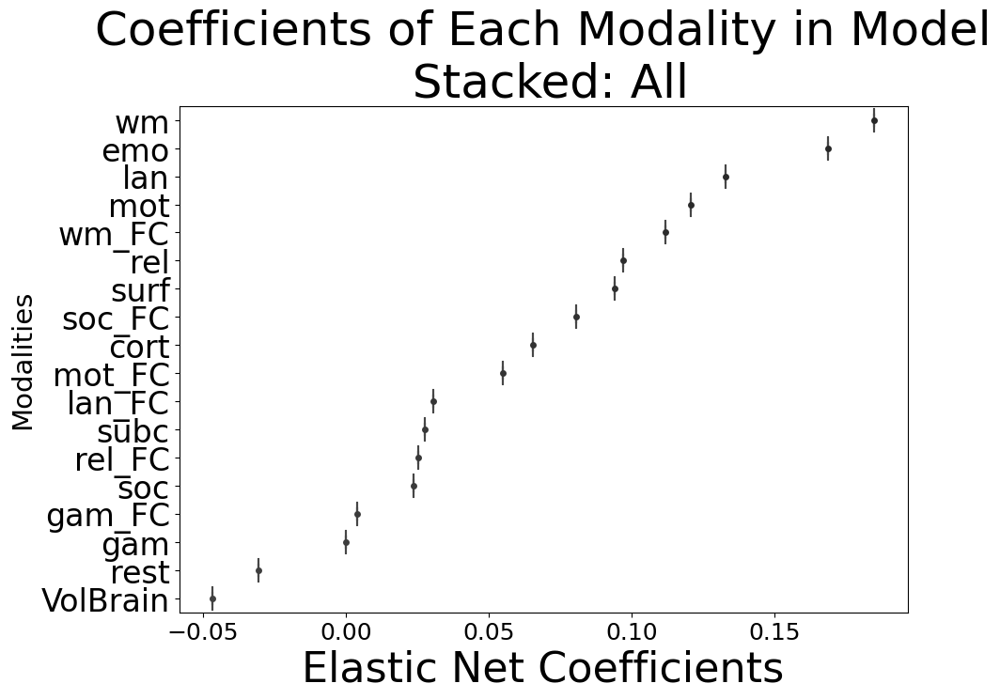

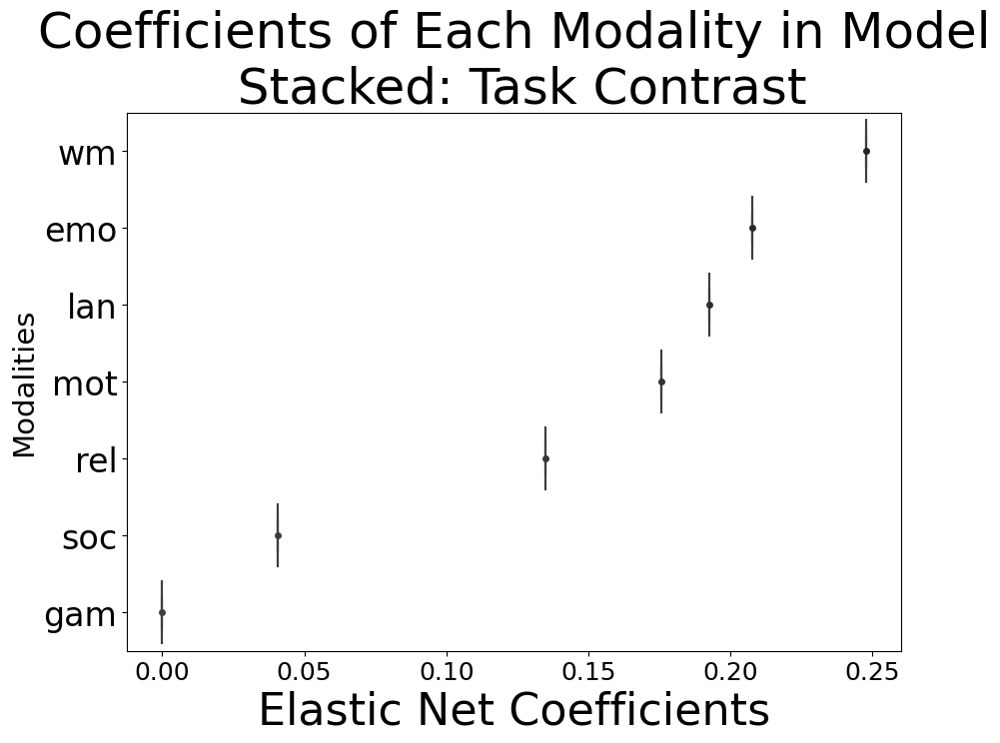

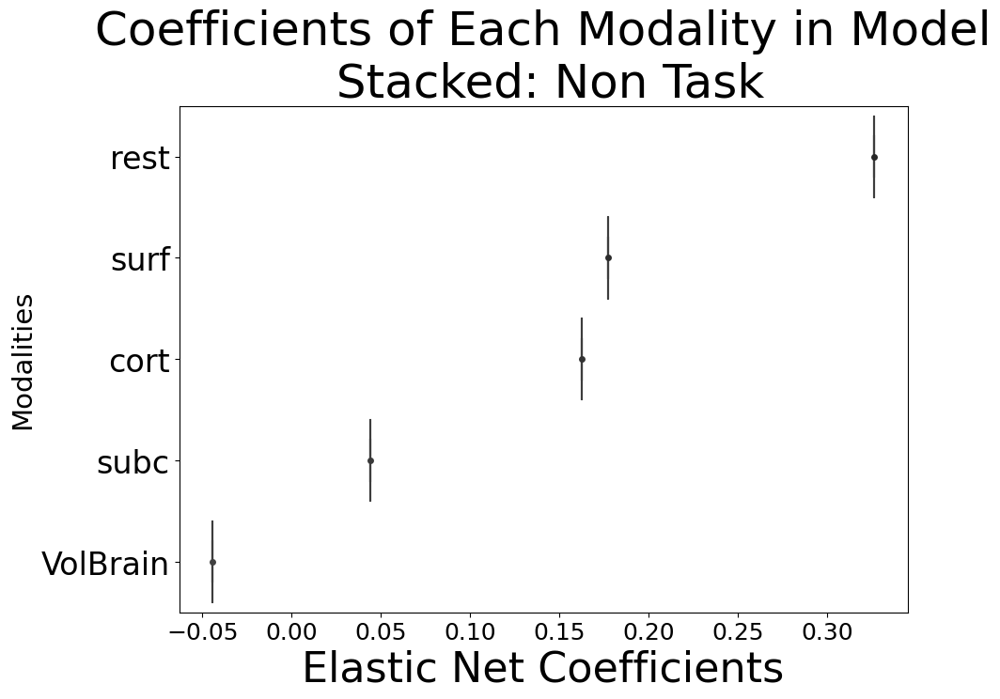

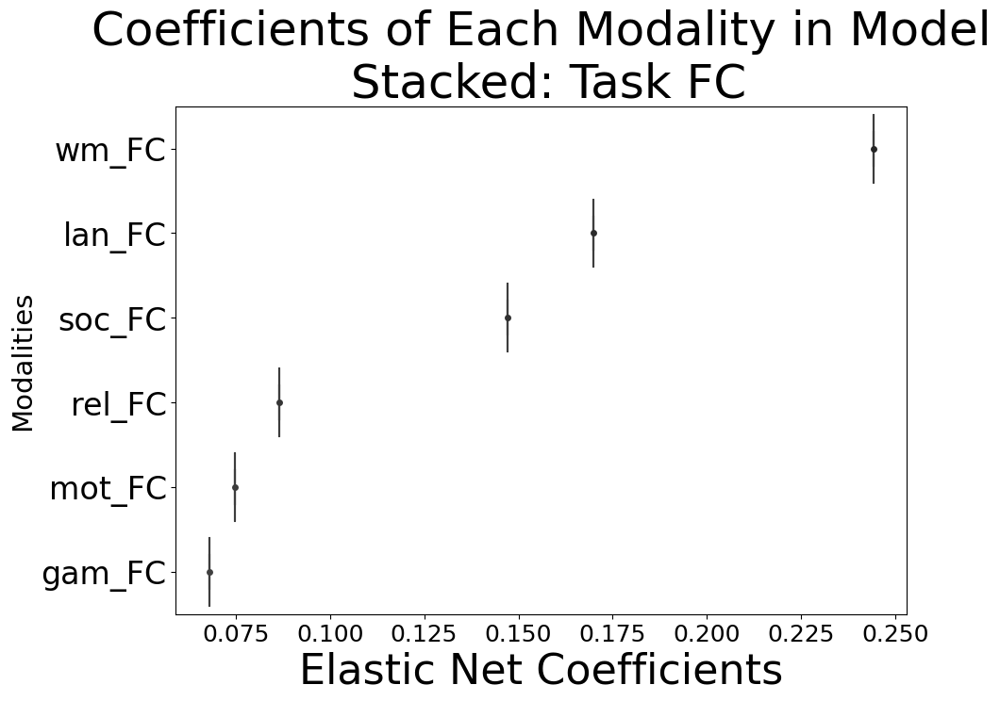

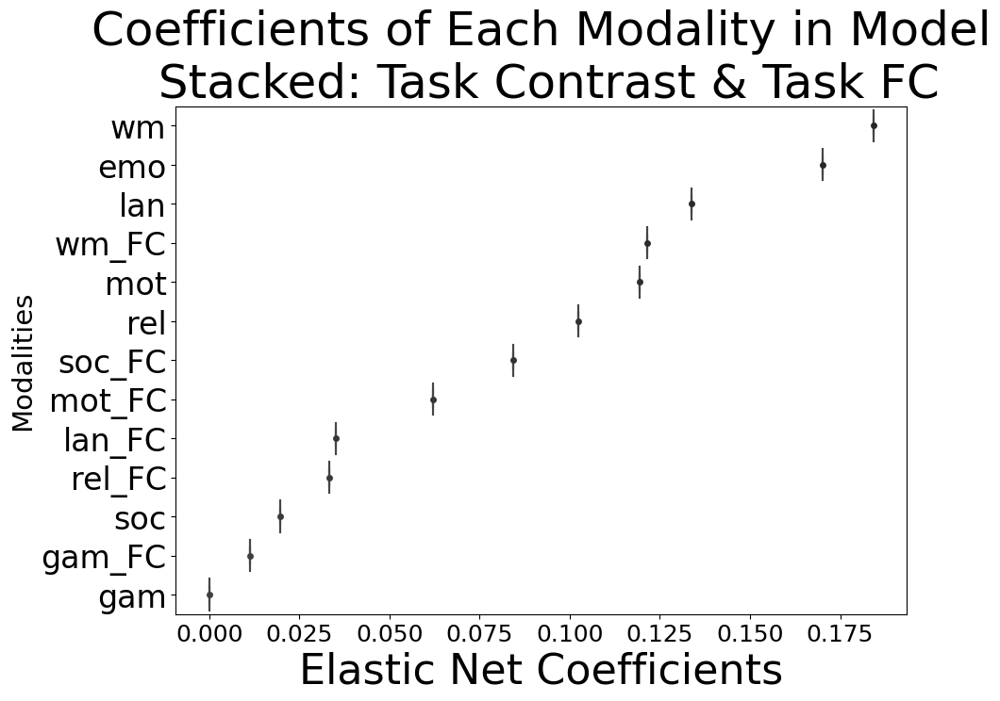

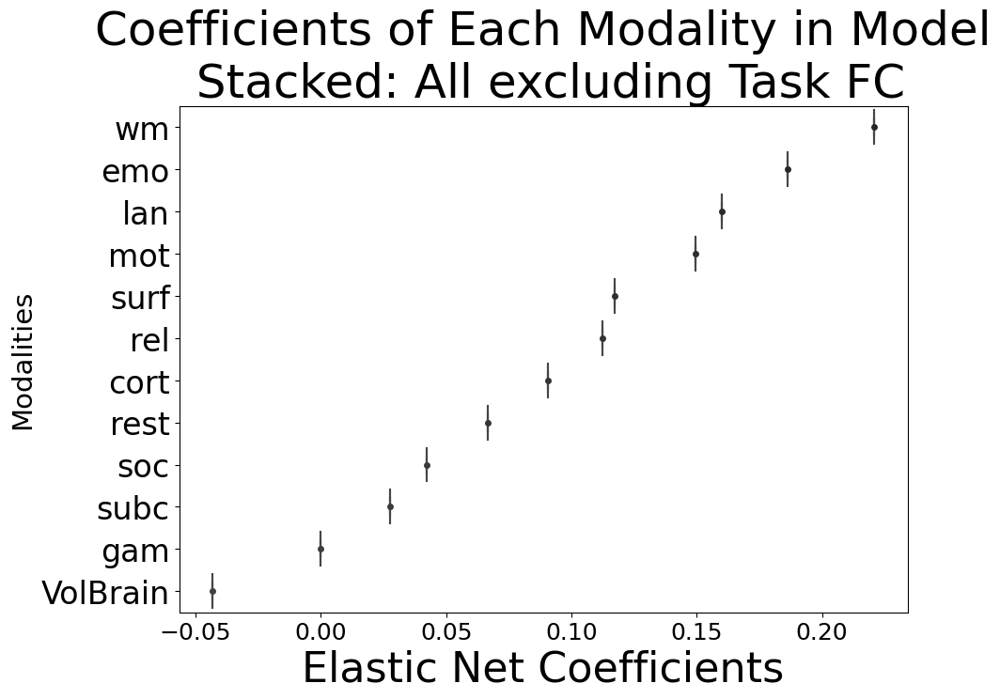

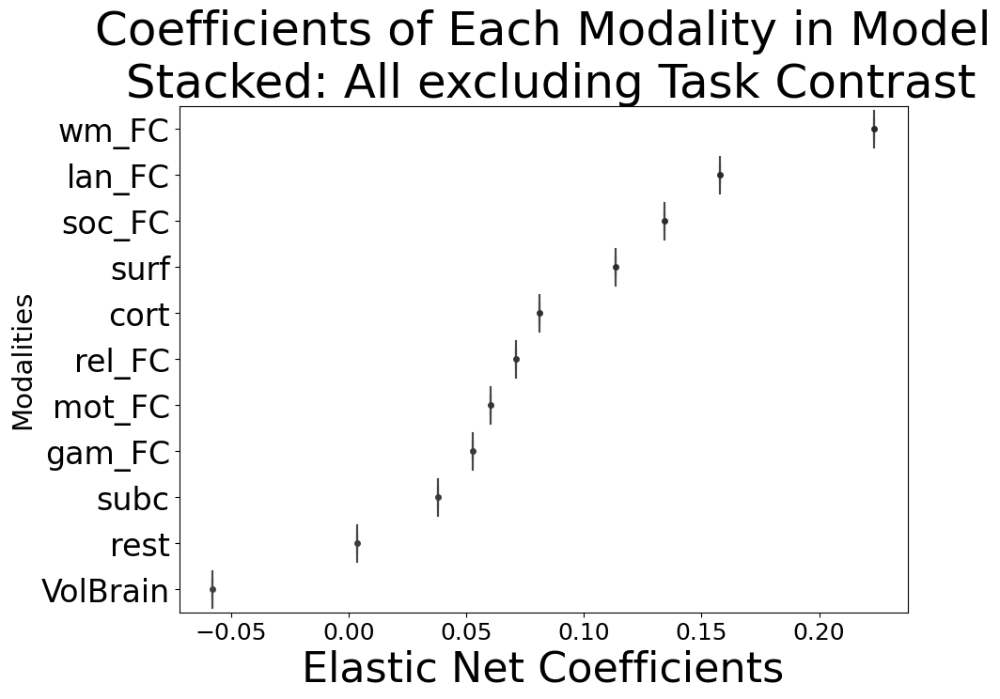

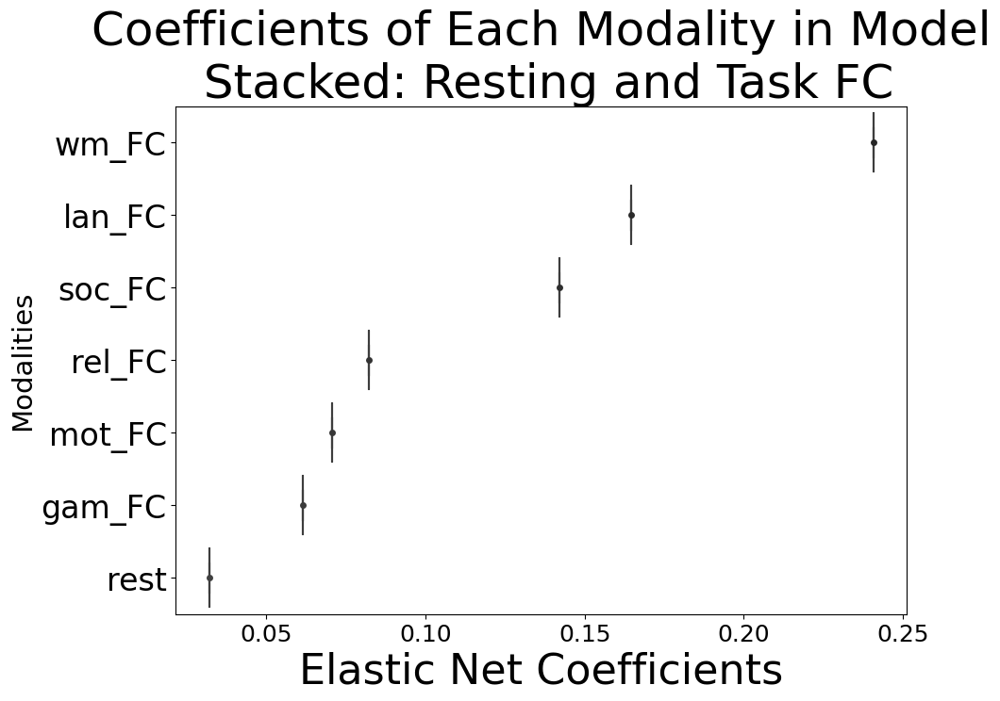

In [11]:
#plot stacked model coeffs 

warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

for key, label in zip(dct_stack_coeff.keys(), lblY[-8:]):
    d=dct_stack_coeff[key].reindex(columns = dct_stack_coeff[key].mean().sort_values(ascending=False).index)

    plt.figure(figsize=(10,7))

    sns.boxplot(data=d, orient="h")
    sns.swarmplot(data=d, color=".25", orient="h")

    plt.xticks(fontsize=18) 
    plt.yticks(fontsize=24)
    plt.xlabel('Elastic Net Coefficients', fontsize=32)
    plt.ylabel('Modalities', fontsize=21)
    plt.title('Coefficients of Each Modality in Model\n '+label ,fontsize=36)

    plt.show()

In [13]:
###Feature coefficients for stacked modality models

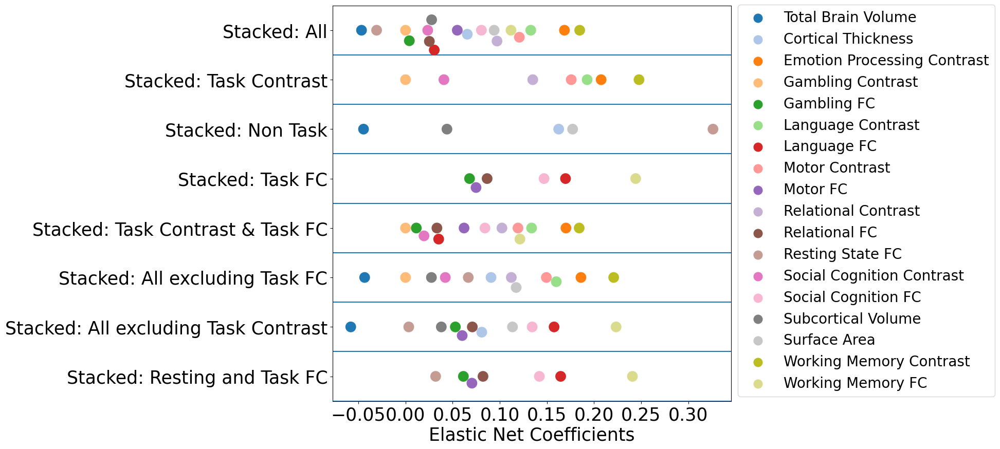

In [14]:
#Plot stacked model coefficients in different way


dct_mean_stack_coef = {}
for key in list(dct_stack_coeff.keys()):
    dct_mean_stack_coef[key] = dct_stack_coeff[key].mean()

df_mean_stack_coef = pd.DataFrame(dct_mean_stack_coef)
df_mean_stack_coef = df_mean_stack_coef.reindex(index = sorted(pd.DataFrame(dct_mean_stack_coef).index))
df_mean_stack_coef.index = lblY[:-8] 
df_mean_stack_coef.columns = lblY[-8:]

#reshape
df_plot_ = pd.DataFrame()
for col in df_mean_stack_coef.columns:
    vct = df_mean_stack_coef[col].values
    ind = df_mean_stack_coef[col].index
    sst = np.full(len(ind), col)
    df__ = pd.DataFrame({'val':vct, 'mod':ind, 'set':sst})
    df_plot_ = pd.concat([df_plot_, df__], axis=0, ignore_index=True)
    
#plot
plt.figure(figsize=(10,10))
sns.swarmplot(data=df_plot_, x='val', y='set', hue='mod', orient="h", 
              palette="tab20", size=15)
for i in np.arange(0.5,8.5,1):
    plt.axhline(y=i)
plt.legend(loc='upper right', bbox_to_anchor=(1.68,1.02), fontsize=20, markerscale=2)
plt.xlabel('Elastic Net Coefficients', fontsize=25)
plt.ylabel('')
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)

plt.savefig(path_img_out+'feat_stack_plot_image.svg',bbox_inches='tight')

plt.show()

##### Extract feature importance for single modality models

In [12]:
###Feature coefficients for single modality models

In [13]:
#extract feature importance from saved models

#for single modalities (except functional connectivities)


dct_elnet_coeff={}

for file in [i.split('/')[-1] for i in sorted(glob.glob(path2+fold+'/*_elnet_model.sav'))]:
    
    if ('_FC_' not in file) and ('rest' not in file):
        
        dct_ = {}
        #extracting feature importance for each fold each modality
        for fold in folders:
            dct_[fold] = (joblib.load(path2+fold+'/'+file)).named_steps['elasticnet'].coef_
        #assign appropriate indexes
        if file.split('_')[0] in ['emo', 'gam', 'lan', 'mot', 'rel', 'soc', 'wm']:
            indxs = ind_task
        elif file.split('_')[0] in ['cort', 'surf']:
            indxs = ind_anat
        elif file.split('_')[0] in ['subc']:
            indxs = ind_subc
        elif file.split('_')[0] in ['VolBrain']:    
            indxs = ind_bVol   
            
        df = pd.DataFrame(dct_ , index=indxs).T 
        #save as csv table
        df.to_csv(path2+file.split('_')[0]+'_elnet_coeffs.csv')
        #save to dictionary
        dct_elnet_coeff[file.split('_')[0]] = df

In [14]:
#extract feature importance from saved models

#for single modalities, only functional connectivities


dct_elnet_FC_coeff={}

for file in [i.split('/')[-1] for i in sorted(glob.glob(path2+fold+'/*_elnet_model.sav'))]:
    
    if ('_FC_' in file) or ('rest'  in file):
        
        dct_ = {}
        #assign appropriate indexes
        indxs = ind_FC
        colsx = np.arange(1,76,1)
        #extracting feature importance for each fold each modality
        for fold in folders:
            #extract PCA values (~71000 of ROI pairs into 75 pc)
            pca_model_ind = np.absolute(((joblib.load(path2+fold+'/PCA_models/PCA_model.sav'))[file.replace("_elnet_model.sav", '')]).components_)
            #extract ElasticNet values for 75 pc
            pc_inx = (joblib.load(path2+fold+'/'+file)).named_steps['elasticnet'].coef_
            #multiply PCA values with ElNet values, and summarize across 75 pc for each ROI pair, for one fold
            dct_[fold] = pd.DataFrame( pca_model_ind.T * pc_inx , index = indxs, columns = colsx).T.sum()  
            
        df = pd.DataFrame(dct_).T
        #save as csv table
        df.to_csv(path2+file.replace("_elnet_model.sav", '')+'_elnet_coeffs.csv')
        #save to dictionary
        dct_elnet_FC_coeff[file.replace("_elnet_model.sav", '')] = df

##### Plotting single modality feature importances

##### check numbers

In [16]:
dct_elnet_coeff.keys()

dict_keys(['VolBrain', 'cort', 'emo', 'gam', 'lan', 'mot', 'rel', 'soc', 'subc', 'surf', 'wm'])

In [17]:
task_keys = ['emo', 'gam', 'lan', 'mot', 'rel', 'soc', 'wm']
anat_keys = ['cort', 'surf']

In [18]:
for tkey in task_keys:
    print( tkey,min(dct_elnet_coeff[tkey].mean()[:360]), max(dct_elnet_coeff[tkey].mean()[:360]))

emo -0.030698797104388557 0.029372223958887993
gam 0.0 0.0
lan -0.0665826847450307 0.08340926985617919
mot -0.03512799051059653 0.027679540010039864
rel -0.034716734682649755 0.05017366143075311
soc -0.03505874100410583 0.040264404926215636
wm -0.06991665698502032 0.05674836813855695


In [20]:
[i for i in dct_elnet_coeff['gam'].mean() if i !=0]

[]

##### Plot on brain surface

##### Task contrasts

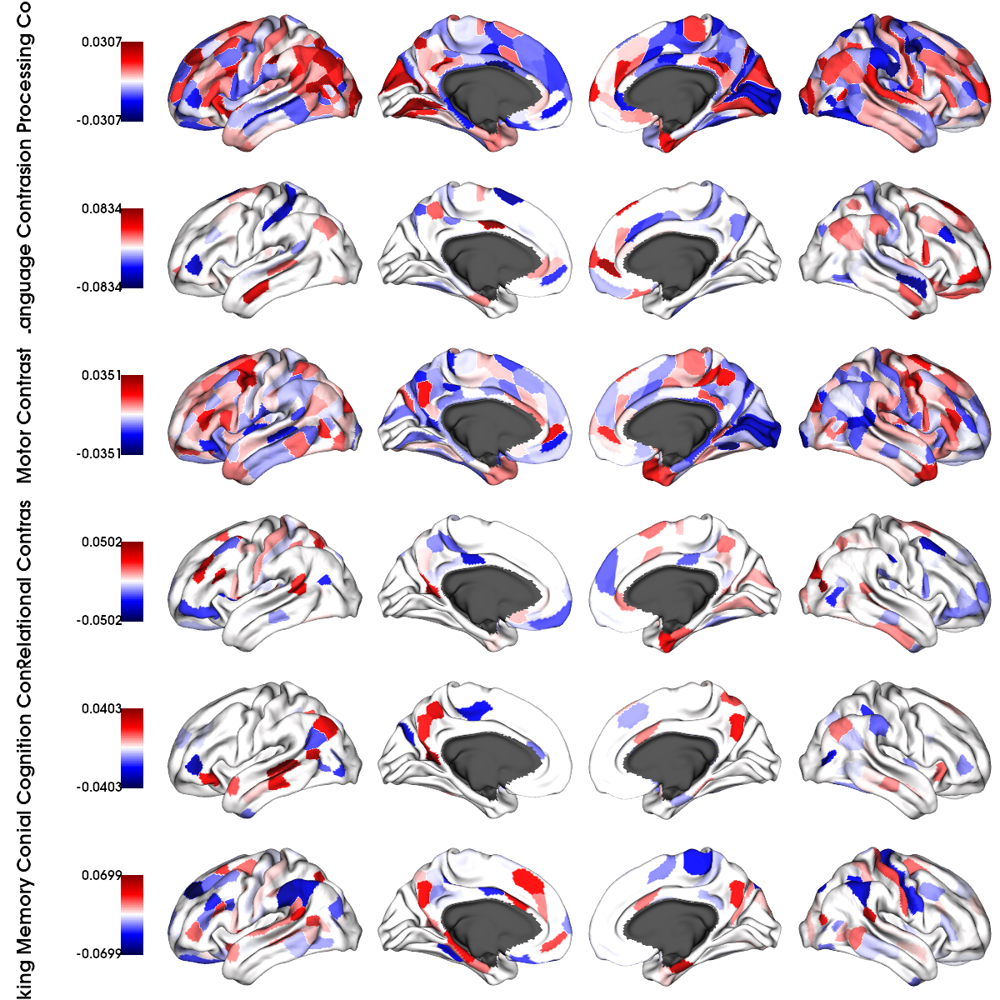

In [22]:
# First load the Glasser annotation file
file_url='https://raw.githubusercontent.com/rcruces/2020_NMA_surface-plot/master/data/glasser_360_conte69.csv'
Glasser = np.loadtxt(urllib2.urlopen(file_url), dtype=int)

# and load the conte69 surfaces
surf_lh, surf_rh = load_conte69()


# Mask the 0-value ROI of the medial wall
mask = Glasser != 0

task_keys = ['emo', 'lan', 'mot', 'rel', 'soc', 'wm']
task_keys_lab = ['Emotion Processing Contrast',
                 'Language Contrast',
                 'Motor Contrast', 
                 'Relational Contrast',
                 'Social Cognition Contrast', 
                 'Working Memory Contrast',]
task = [None] * len(task_keys)

for i, tkey in enumerate(task_keys):
    # add a 0 entry that will match the medial wall index of the final array
    rho = np.concatenate((0, dct_elnet_coeff[tkey].mean()[:360].values), axis=None)
    # Map the vector values to the vertices indices
    rho_ver = map_to_labels(rho, Glasser, mask=mask,fill=np.nan)
    
    task[i] = rho_ver


# Plot  values over the surface
plot_hemispheres(surf_lh, surf_rh,      # Surfaces
                 array_name=task,    # Vector of alues to plot
                 size=(1200, 200*len(task_keys)),       # Size of the output figure
                 #label_text={'left':['random rho']}, # Text and position
                 color_bar='left',#color_bar='top',       # Position of the colorbar
                 cmap='seismic',       # COlormap from matplotlib
                 zoom=1.5,             # zoom on the surface
                 embed_nb=True,         # Embeded this ins inline plot
                 interactive=False,     # Pop-up plot, for embed_nb=True default is False
                 #share='both',          # match to colormap on rows and columns
                 color_range='sym',#(-0.13, 0.13),       # color range
                 nan_color=(0.25, 0.25, 0.25, 1), # nan-color (medial wall) default black
                 background = (1, 1, 1),# Background color, default is white
                 label_text=task_keys_lab
                )



emo


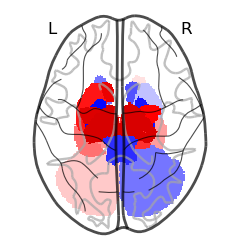

lan


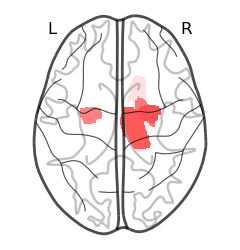

mot


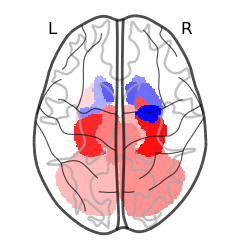

rel


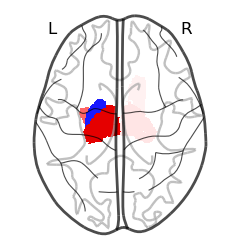

soc


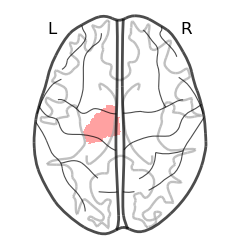

wm


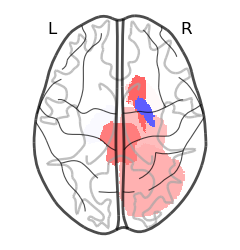

In [23]:
#plot task contrasts on one brain projection, subcortex only

#load atlases
wway = '/media/hcs-psy-narun/Alina/atlases/'
atlas2 = nli.load_img(wway+'subc2.fs.nii.gz')

par_dat2 = atlas2.get_fdata()


for key in ['emo', 'lan', 'mot', 'rel', 'soc', 'wm']: #contrasts only
    #empty image in the same way as reffered atlas
    site_nii2 = np.zeros(par_dat2.shape)
    #dataframe to plot
    data = dct_elnet_coeff[key]   
    
    #subcortex, the table has same order as atlas
    vec2 = pd.Series((data.mean()[360:]).values, index=pd.read_csv(wway+'atlas_index_num.txt')['nn'].values )

    for index, numb in zip(vec2.index, vec2.iloc[:]): 
        site_nii2[par_dat2 == (index)] = numb
    
    #create image object
    site_img2 = nli.new_img_like(atlas2, site_nii2, atlas2.affine, copy_header=True)
    
    #display
    print(key)
    display2 = plotting.plot_glass_brain(site_img2, plot_abs=False, cmap='seismic',       
                                         colorbar=False, display_mode='z', 
                                         #vmin=min(data.mean()), 
                                         vmax=round(max(max(data.mean()), abs(min(data.mean()))), 4),
                                         symmetric_cbar=True
                                        )
    
    plt.savefig(path_img_out+'feat_single_task_subc_'+key+'_plot_image.svg',bbox_inches='tight')
    
    plotting.show()

##### Structural mri

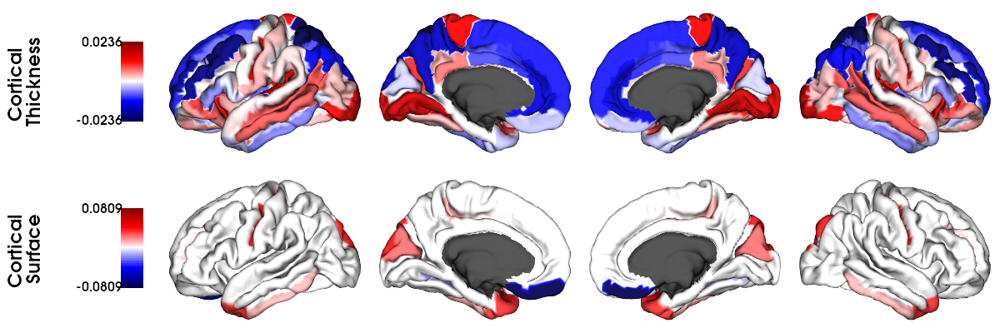

In [24]:
# Fetch surface atlas
destrx = datasets.fetch_atlas_surf_destrieux()

# Load fsaverage5 surfaces
surf_lh, surf_rh = load_fsa5()

# Remove non-cortex regions
regions = destrx['labels'].copy()
masked_regions = [b'Medial_wall', b'Unknown']
masked_labels = [regions.index(r) for r in masked_regions]
for r in masked_regions:
    regions.remove(r)

# Build Destrieux parcellation and mask
labeling = np.concatenate([destrx['map_left'], destrx['map_right']])
mask_destrx = ~np.isin(labeling, masked_labels)


# Map gradients to original parcels
anat_keys = ['cort', 'surf']
anat_keys_lab = ['Cortical \nThickness', 
                 'Cortical \nSurface']
anat = [None] * len(anat_keys)
for i, akey in enumerate(anat_keys):
    rho = map_to_labels(dct_elnet_coeff[akey].mean().values, labeling, mask=mask_destrx, fill=np.nan)
    
    anat[i] = rho

plot_hemispheres(surf_lh, surf_rh, 
                 array_name=anat, 
                 size=(1200, 200*len(anat_keys)), 
                 cmap='seismic',
                 color_bar='left', 
                 zoom=1.5,
                 embed_nb=True,         
                 interactive=False,
                 #share='both',
                 color_range='sym',#(-0.1, 0.1),       # color range
                 nan_color=(0.25, 0.25, 0.25, 1), # nan-color (medial wall) default black
                 background = (1, 1, 1),
                 label_text=anat_keys_lab
                )

subc


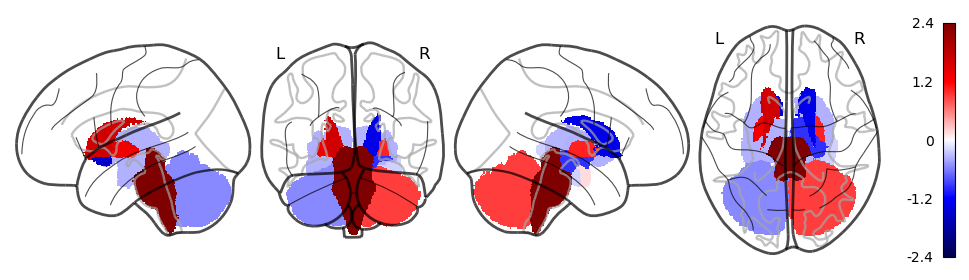

In [25]:
#plot anatomical cortical and subcortical feature importance (from FreeSurfer, Destrieux atlas)
wway = '/media/hcs-psy-narun/Alina/atlases/'
#load atlases
atlas2 = nli.load_img(wway+'subc2.fs.nii.gz')



    
#subcortex

#empty image in the same way as reffered atlas
par_dat2 = atlas2.get_fdata()
site_nii2 = np.zeros(par_dat2.shape)
#reorder subc table into atlas order
dtvc = dct_elnet_coeff['subc']
#std
dtvc = pd.DataFrame(StandardScaler().fit_transform(dtvc.T.values),
                    index=dtvc.T.index, columns=dtvc.T.columns).T
v2 = dtvc.mean()
vec2 =pd.Series(v2.values, index=pd.read_csv(wway+'atlas_index_num.txt')['nn'].values )
#fill mat with numbers
for index, numb in zip(vec2.index, vec2.iloc[:]): 
    site_nii2[par_dat2 == (index)] = numb
#create image object
site_img2 = nli.new_img_like(atlas2, site_nii2, atlas2.affine, copy_header=True)
#display
print('subc')
display_subc = plotting.plot_glass_brain(site_img2, plot_abs=False, cmap='seismic',  #different colormap
                                         colorbar=True, display_mode='lyrz', 
                                        symmetric_cbar=True)

plt.savefig(path_img_out+'feat_single_struct_subc_plot_image.svg',bbox_inches='tight')

plotting.show()

In [26]:
dct_elnet_coeff['VolBrain'].columns

Index(['FS_IntraCranial_Vol', 'FS_TotCort_GM_Vol', 'FS_SubCort_GM_Vol',
       'FS_Tot_WM_Vol', 'FS_BrainSegVol_eTIV_Ratio'],
      dtype='object')

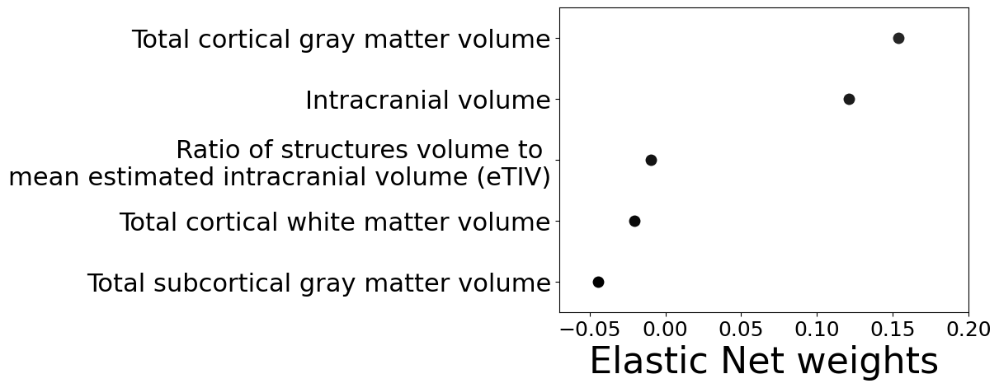

In [27]:
#Total Brain Volume

data = dct_elnet_coeff['VolBrain']
data.columns = ['Intracranial volume',
'Total cortical gray matter volume',
'Total subcortical gray matter volume',
'Total cortical white matter volume',
'Ratio of structures volume to \nmean estimated intracranial volume (eTIV)']

#data = pd.DataFrame(StandardScaler().fit_transform(data.T.values), 
#                    index=data.T.index, columns=data.T.columns).T

data = data.loc[:, data.mean().sort_values(ascending=False).index]

data.T.to_csv(path2+'TBV_plot_numbers.csv')

#sns.boxplot(data=data, orient="h", color='tab:blue')
sns.swarmplot(data=data, color="black", orient="h", size=10)

plt.xticks(fontsize=18)
plt.yticks(fontsize=22)
plt.xlim((-0.07,0.2))
#plt.xlabel('', fontsize=21)
plt.xlabel('Elastic Net weights', fontsize=32)
#plt.title('Coefficients of Each Feature in\nthe Total Brain Volume Modality\n',fontsize=36)

plt.savefig(path_img_out+'feat_single_TotalVolume_plot_image.svg',bbox_inches='tight')

plt.show()

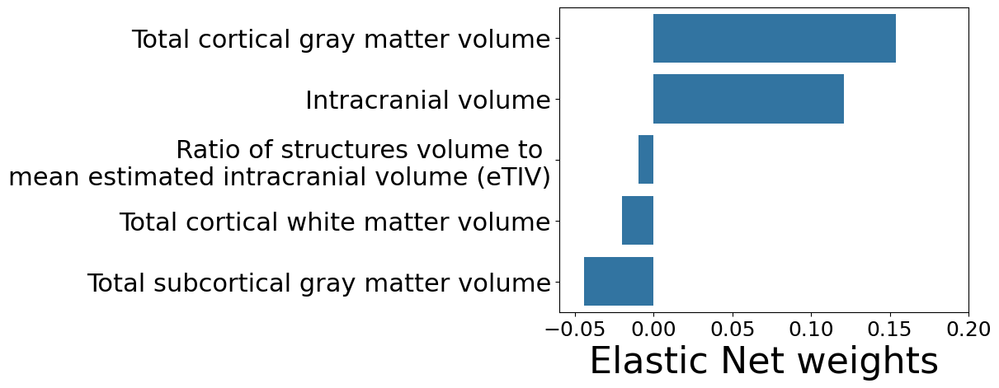

In [28]:
#Total Brain Volume

data = dct_elnet_coeff['VolBrain']
data.columns = ['Intracranial volume',
'Total cortical gray matter volume',
'Total subcortical gray matter volume',
'Total cortical white matter volume',
'Ratio of structures volume to \nmean estimated intracranial volume (eTIV)']

#data = pd.DataFrame(StandardScaler().fit_transform(data.T.values), 
#                    index=data.T.index, columns=data.T.columns).T

data = data.loc[:, data.mean().sort_values(ascending=False).index]
#data.T.to_csv(path2+'TBV_plot_numbers.csv')
sns.barplot(data=data, orient="h", color='tab:blue')
#sns.swarmplot(data=data, color="black", orient="h", size=10)

plt.xticks(fontsize=18)
plt.yticks(fontsize=22)
plt.xlim((-0.06,0.2))
#plt.xlabel('', fontsize=21)
plt.xlabel('Elastic Net weights', fontsize=32)
#plt.title('Coefficients of Each Feature in\nthe Total Brain Volume Modality\n',fontsize=36)

plt.savefig(path_img_out+'feat_single_TotalVolume_plot_image2.svg',bbox_inches='tight')

plt.show()

#### Resting State and Tasks FC

In [31]:
#reorganize from pairs of ROIs back to matrix format

dct_FC_mat = {}
for key in ['rest', 'gam_FC', 'lan_FC', 'mot_FC', 'rel_FC', 'soc_FC', 'wm_FC']:
    #dataframe to convert
    data_i  = dct_elnet_FC_coeff[key]

    df_std_FC = pd.DataFrame()
    #standardize
    for indx in data_i.index:
        df_std_FC[indx] = pd.DataFrame(StandardScaler().fit_transform(data_i.loc[indx,:].values.reshape(-1, 1)), 
                                       index=data_i.loc[indx,:].index)[0]
    df_std_FC = df_std_FC.T
    
    #average across folds    
    data = df_std_FC.mean()

    #restore full matrix
    ind379 = np.triu_indices(379, k=1)
    mat379 = np.zeros((379,379),float)
    mat379[ind379]=data.values
    mat379_2 = pd.DataFrame(mat379).replace(0, np.nan)
    mat379_f = pd.DataFrame(np.where(mat379,mat379_2,mat379_2.T))
    mat379_f.index = ind_task
    mat379_f.columns = ind_task
    
    #save mat to dct
    dct_FC_mat[key] = mat379_f

In [32]:
glanets = pd.read_csv('/media/hcs-psy-narun/Alina/atlases/Glasser-Cole_match_table.txt')

In [33]:
tab_subc = pd.DataFrame({'orig_order':np.arange(361,380,1),
                         'left_first_order':np.arange(361,380,1),
                         'Cole_net_order':np.full(19,13),
                         'name_Glasser':ind_task[-19:],
                         'Cole_net_name':np.full(19,'Subcortex')
                         }, index=np.arange(360,379,1))

In [34]:
glanets = pd.concat([glanets,tab_subc], axis=0)

In [35]:
vec = []
vec_nms = []
k=0
for i in sorted(set(glanets['Cole_net_order'])):
    #print(i)
    display()
    k+= int(len(glanets[glanets['Cole_net_order']==i].index))
    vec+=[k]
    nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
    vec_nms+= [nms]

In [36]:
# min and max for each modality
for key in ['rest', 'gam_FC', 'lan_FC', 'mot_FC', 'rel_FC', 'soc_FC', 'wm_FC']:
    print(key)
    print('max', dct_FC_mat[key].max().max())
    print('min', dct_FC_mat[key].min().min())

rest
max 5.482693440071807
min -5.327293320132145
gam_FC
max 4.181403915900182
min -4.427692959177423
lan_FC
max 4.760537857503164
min -4.051643390933626
mot_FC
max 3.845935350906754
min -4.037638721139864
rel_FC
max 4.459753276810245
min -4.363229833106578
soc_FC
max 4.562358372286719
min -4.283817286586963
wm_FC
max 5.365432831895485
min -4.096300295055109


rest


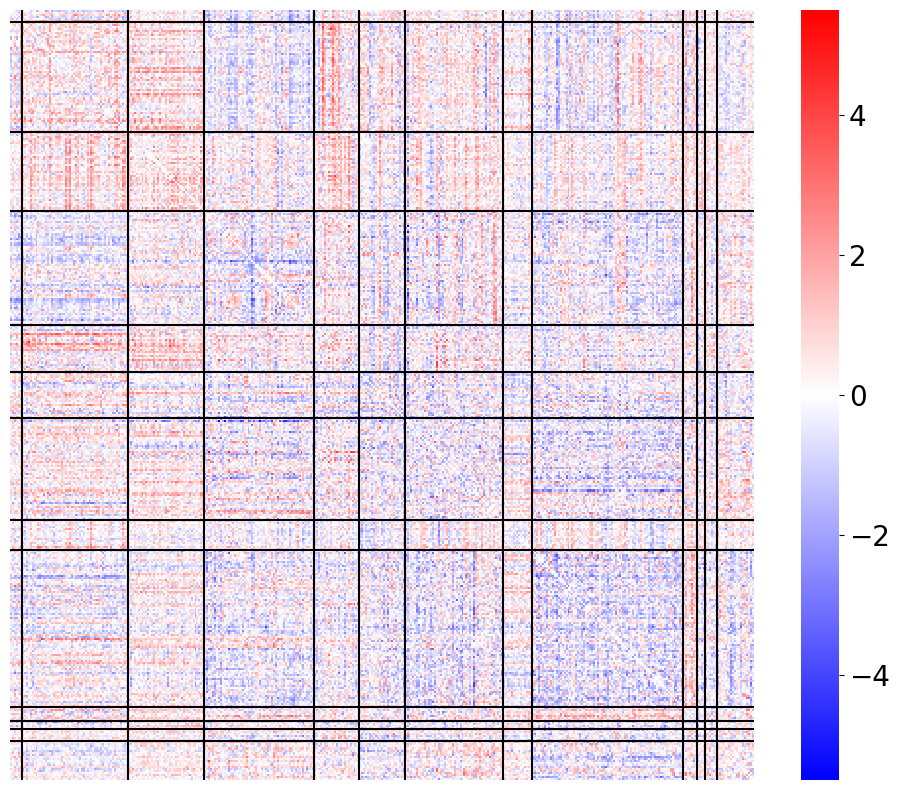

gam_FC


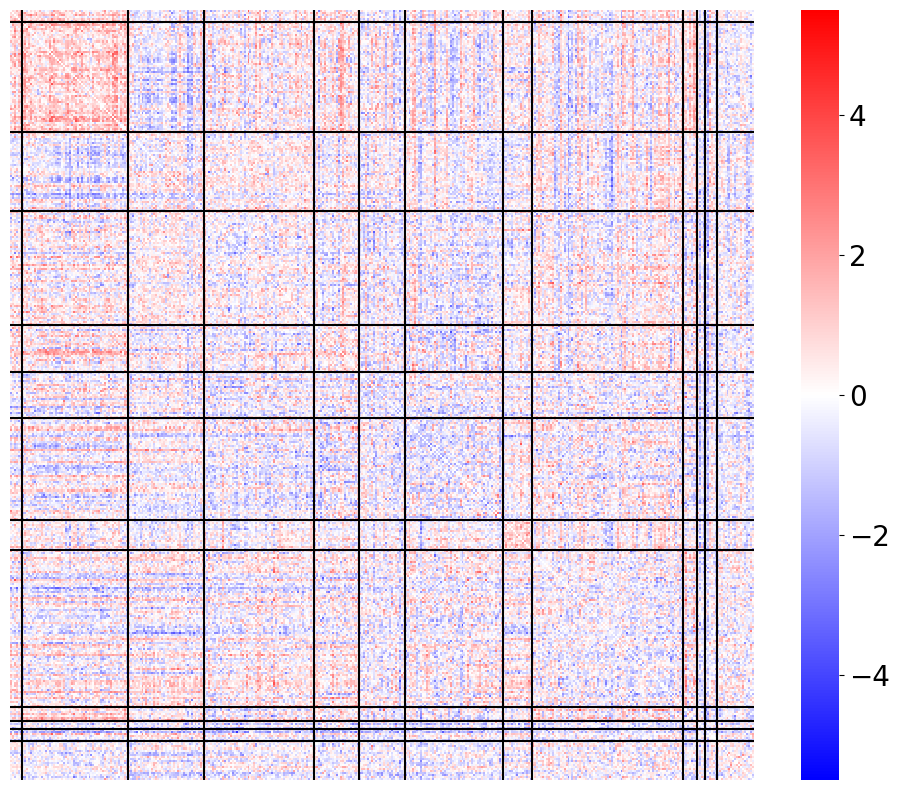

lan_FC


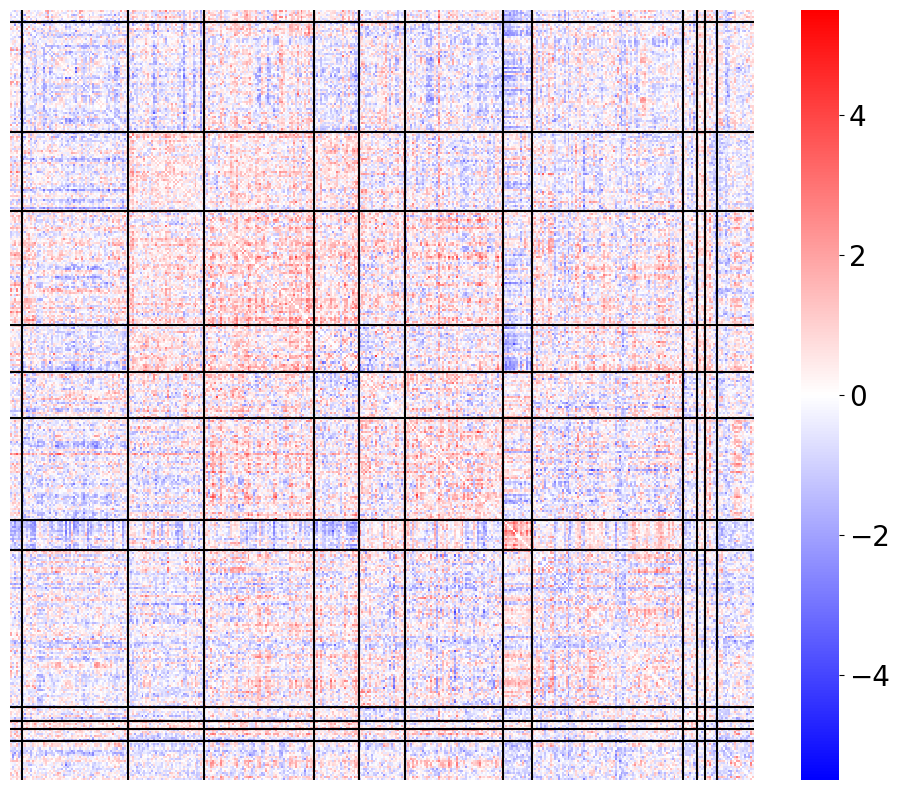

mot_FC


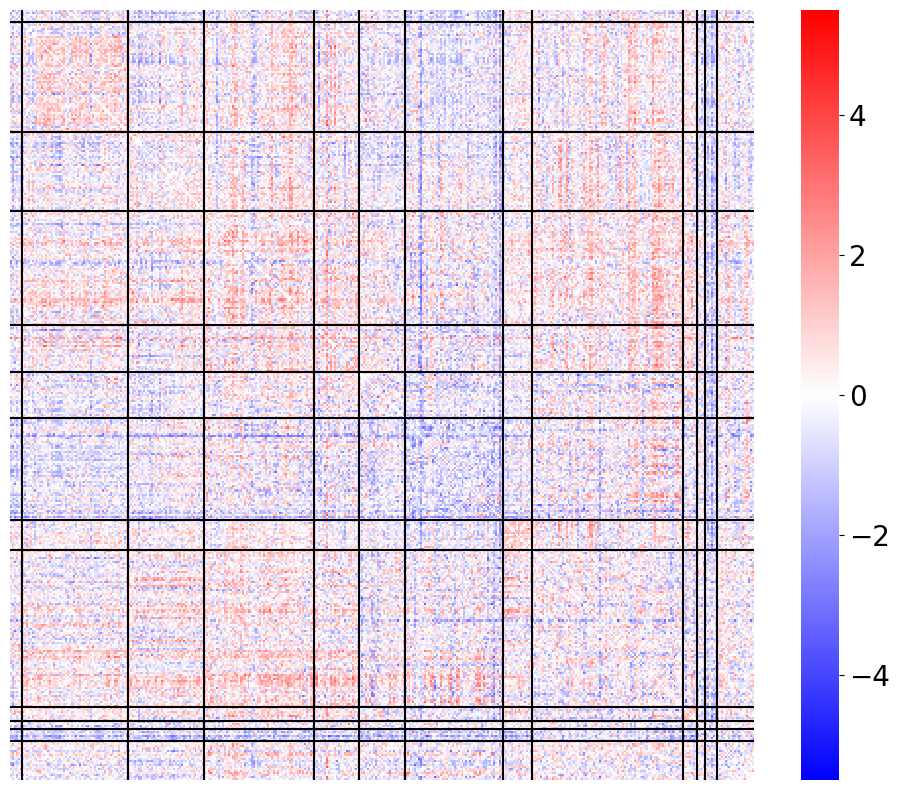

rel_FC


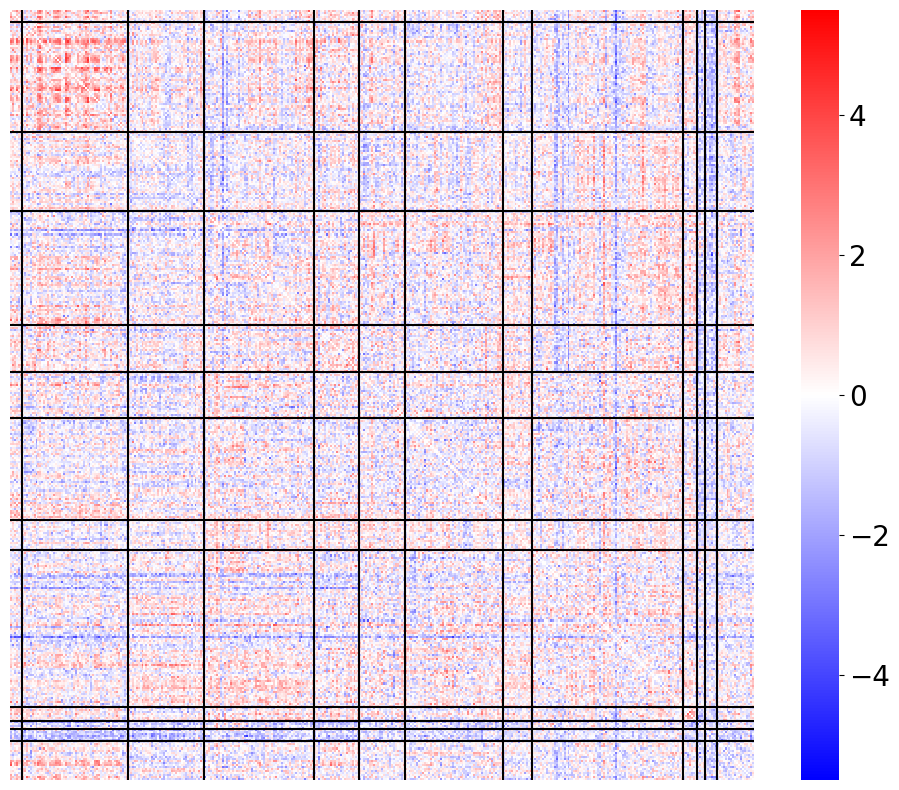

soc_FC


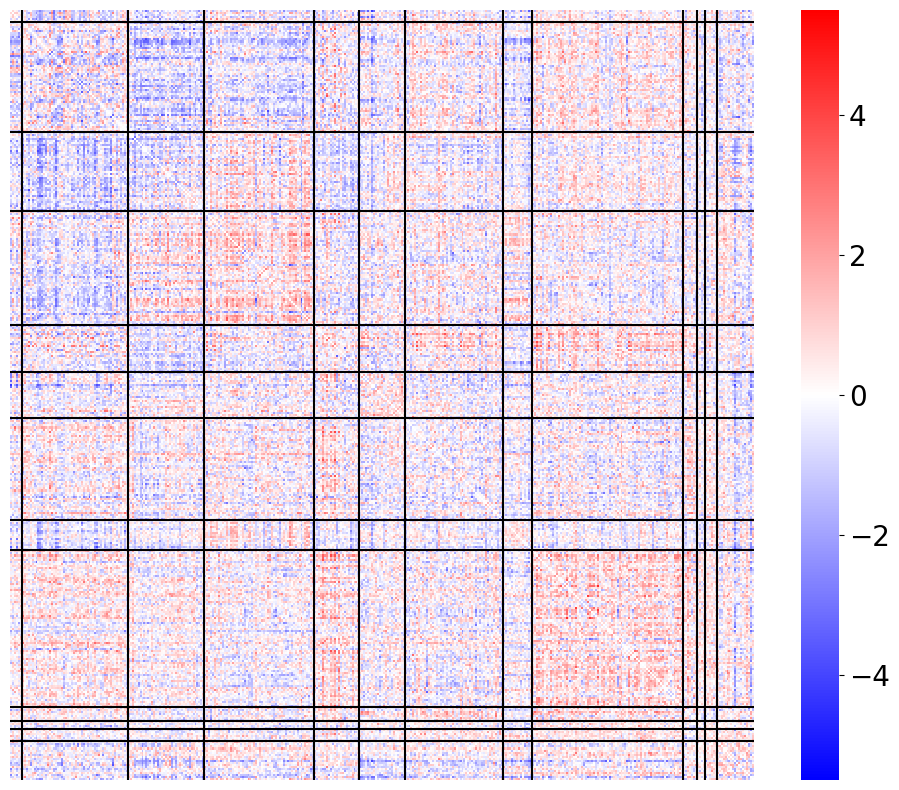

wm_FC


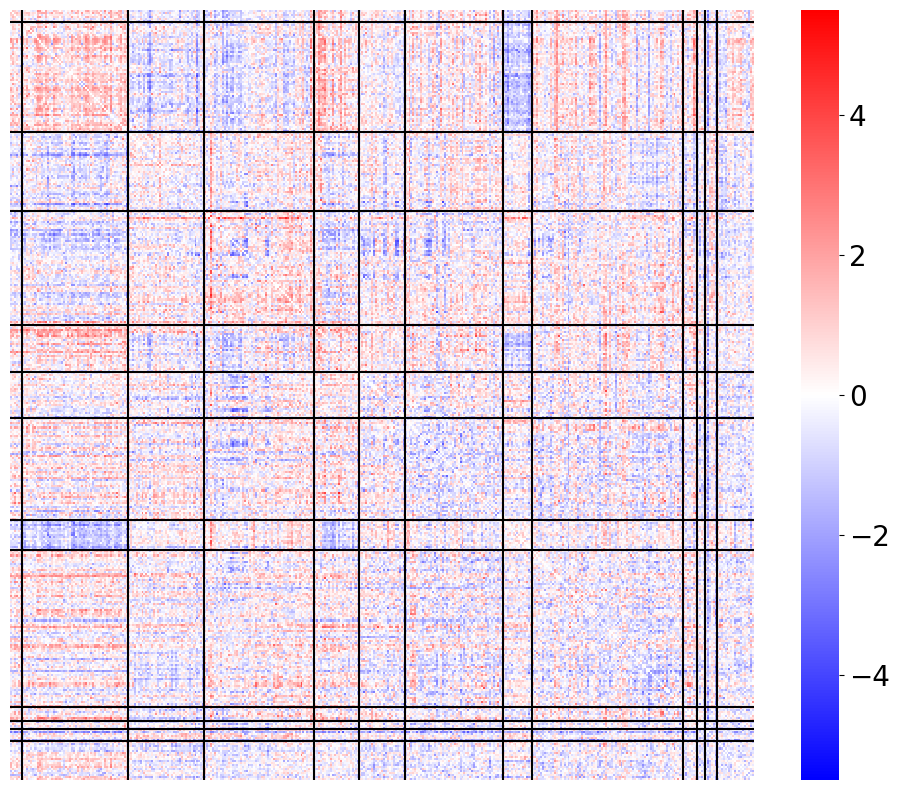

In [37]:
for key in ['rest', 'gam_FC', 'lan_FC', 'mot_FC', 'rel_FC', 'soc_FC', 'wm_FC']:
    print(key)
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values
    data = dct_FC_mat[key].reindex(index=indx, columns=indx)

    fig= plt.figure(figsize=(12,10))

    ax =sns.heatmap(data=data, cmap='bwr',vmin=-5.5, vmax=5.5)
    plt.xticks([])
    plt.yticks([])

    vec = []
    vec_nms = []
    k=0
    for i in sorted(set(glanets['Cole_net_order'])):
        #print(i)
        display()
        k+= int(len(glanets[glanets['Cole_net_order']==i].index))
        vec+=[k]
        nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
        vec_nms+= [nms]

    for k in vec[:-1]:
        plt.axvline(x=k, color='black')
        plt.axhline(y=k, color='black')

    # use matplotlib.colorbar.Colorbar object
    cbar = ax.collections[0].colorbar
    # here set the labelsize by 20
    cbar.ax.tick_params(labelsize=20)

    plt.savefig(path_img_out+'FI_Brain_NoAdj_FCs_'+key+'_1_plot_image.svg',bbox_inches='tight')

    plt.show()

rest


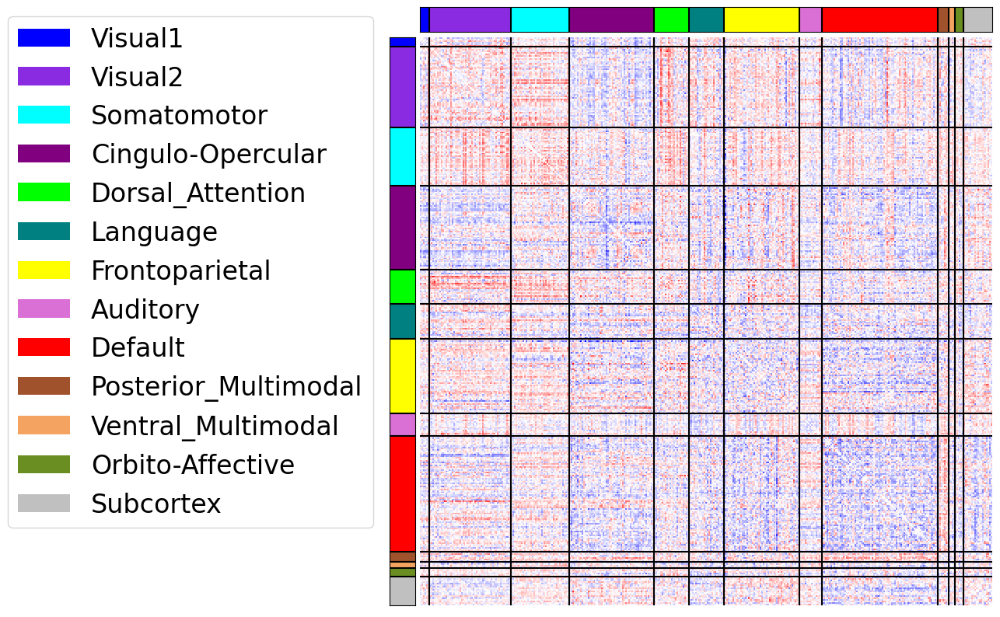

gam_FC


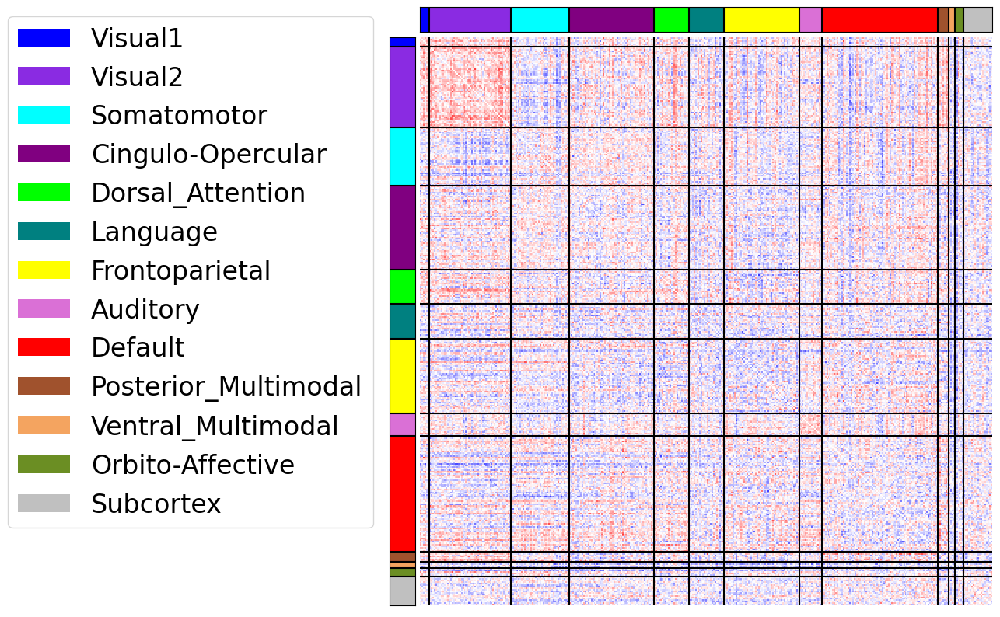

lan_FC


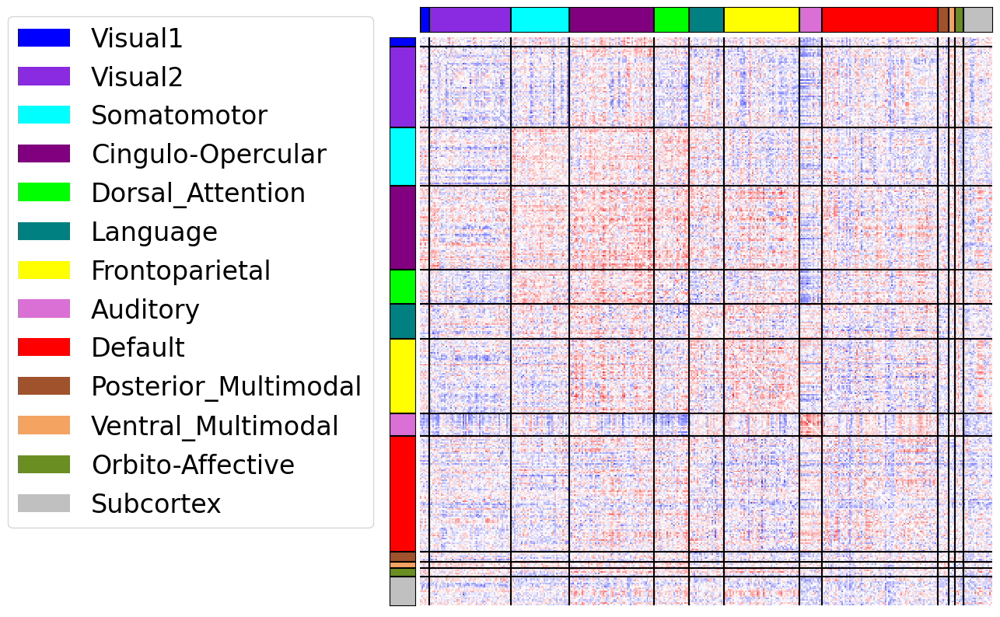

mot_FC


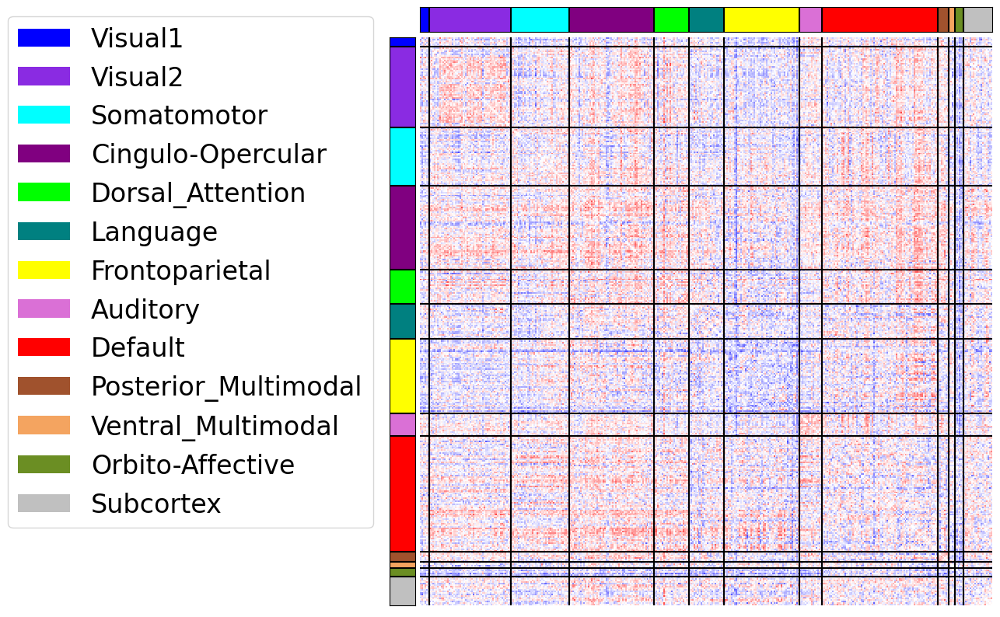

rel_FC


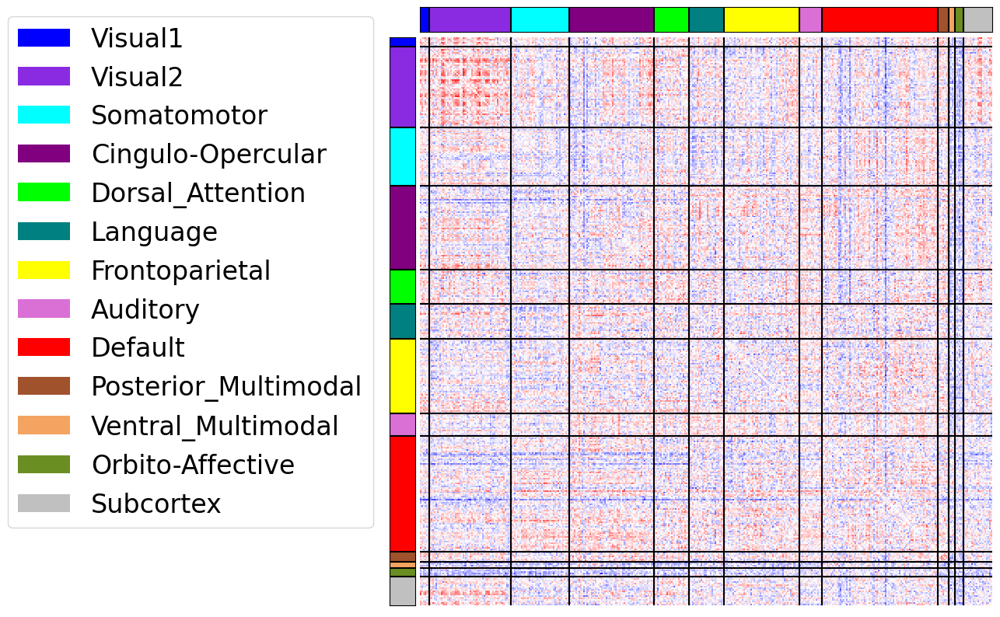

soc_FC


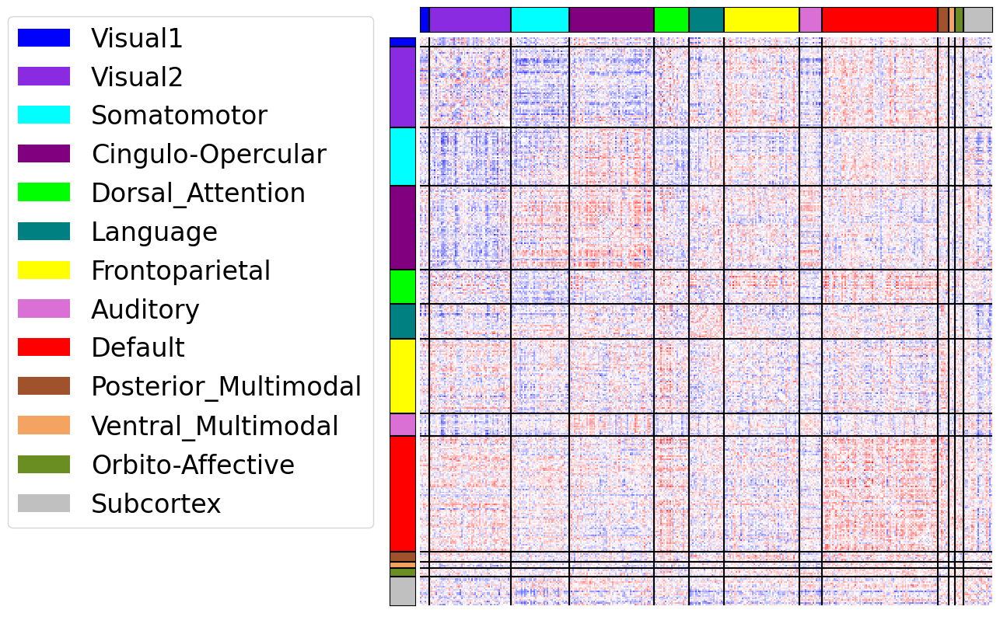

wm_FC


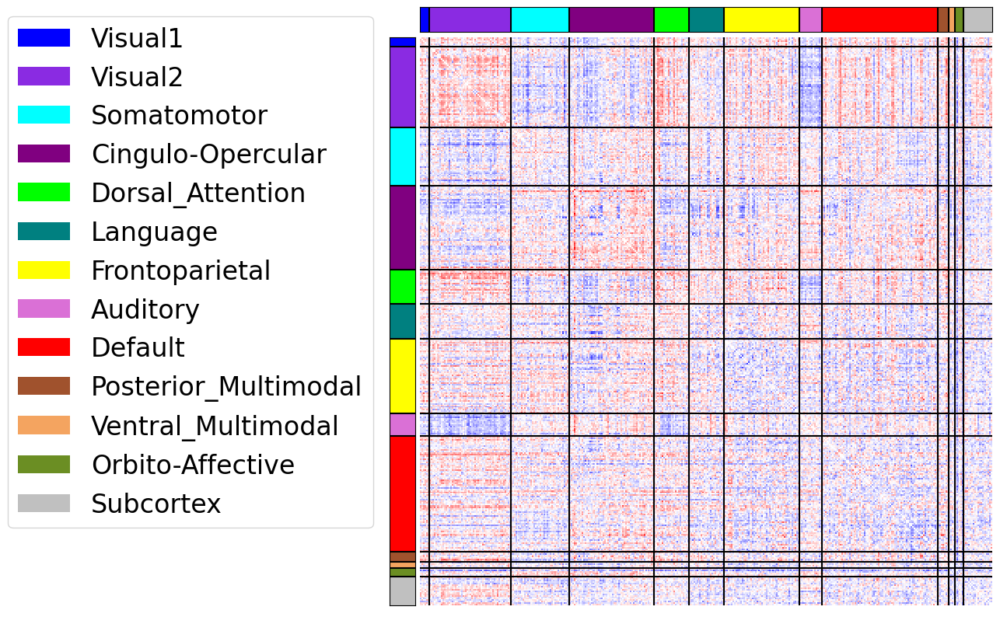

In [38]:
for key in ['rest', 'gam_FC', 'lan_FC', 'mot_FC', 'rel_FC', 'soc_FC', 'wm_FC']:
    print(key)
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values

    data = dct_FC_mat[key].reindex(index=indx, columns=indx)


    fig= plt.figure(figsize=(10,10))

    ax1 = plt.subplot2grid((20, 20), (0, 1), colspan=19) #x, horizontal
    ax2 = plt.subplot2grid((20, 20), (1, 0), rowspan=19) #y, vertical
    ax3 = plt.subplot2grid((20, 20), (1, 1), rowspan=19, colspan=19, sharex=ax1, sharey=ax2)


    vec = []
    vec_nms = []
    k=0
    for i in sorted(set(glanets['Cole_net_order'])):
        #print(i)
        display()
        k+= int(len(glanets[glanets['Cole_net_order']==i].index))
        vec+=[k]
        nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
        vec_nms+= [nms]


    for k in vec[:-1]:
        ax1.axvline(x=k, color='black')
        ax2.axhline(y=k, color='black')
        ax3.axvline(x=k, color='black')
        ax3.axhline(y=k, color='black')

    clrss = ['blue', 'blueviolet', 'cyan', 'purple', 'lime', 'teal', 'yellow', 'orchid', 'red', 'sienna', 'sandybrown', 'olivedrab', 'silver']    
    #clrss = clrss[::-1]
    lblss = vec_nms

    for n in range(len(vec)):
        if n==0:
            xmin=0
            xmax=vec[n]
        else:
            xmin=vec[n-1]
            xmax=vec[n]

        ax1.axvspan(xmin=xmin, xmax = xmax, ymax=1, facecolor=clrss[n], label=lblss[n])
        ax2.axhspan(ymin=xmin, ymax = xmax, xmax=1, facecolor=clrss[n])

    ax3 = sns.heatmap(data=data, cmap='bwr',vmin=-5, vmax=5,  cbar=False)#square=True,
    ax3.set_xticks([])
    ax3.set_yticks([])   

    ax1.set_ylim((0,0.5))
    ax2.set_xlim((0,0.5))
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax2.set_xticks([])
    ax2.set_yticks([])

    fig.legend(bbox_to_anchor=(0.12,0.885), fontsize=24)
    #ax2.legend(sns.color_palette('inferno', as_cmap=True))
    #fig.colorbar(sns.color_palette('inferno', as_cmap=True))
    #fig.colorbar(cm.ScalarMappable(cmap='inferno'), ax=axs[10:12])

    plt.savefig(path_img_out+'FI_Brain_NoAdj_FCs_'+key+'_2_plot_image.svg',bbox_inches='tight')

    plt.show()

rest


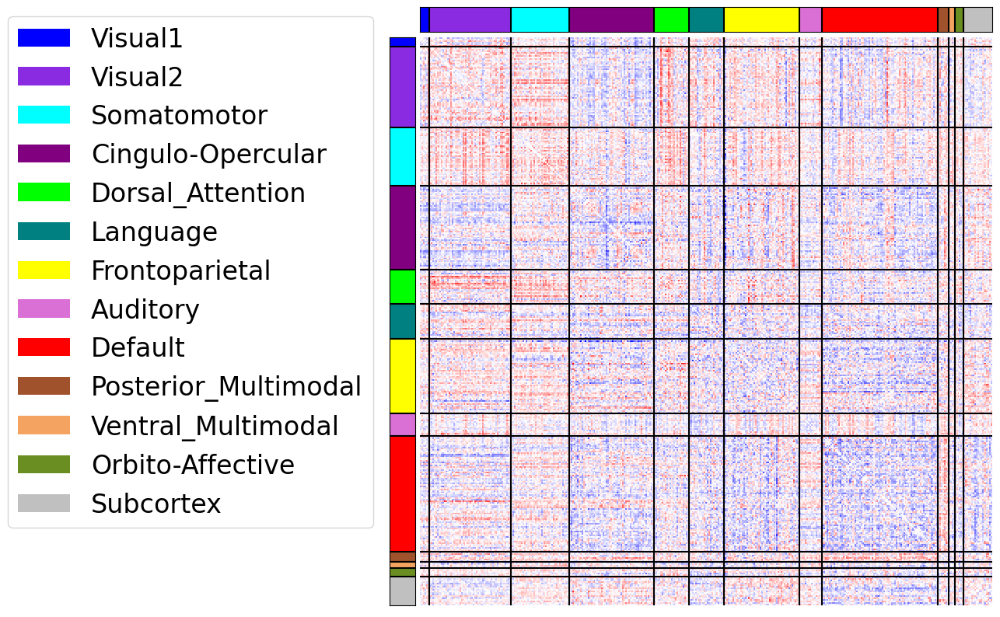

gam_FC


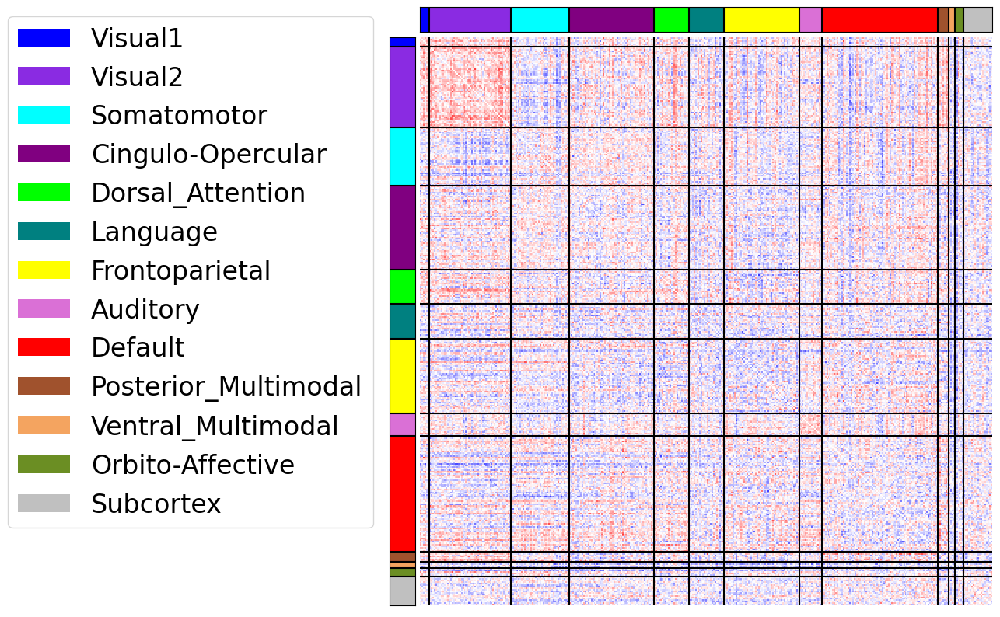

lan_FC


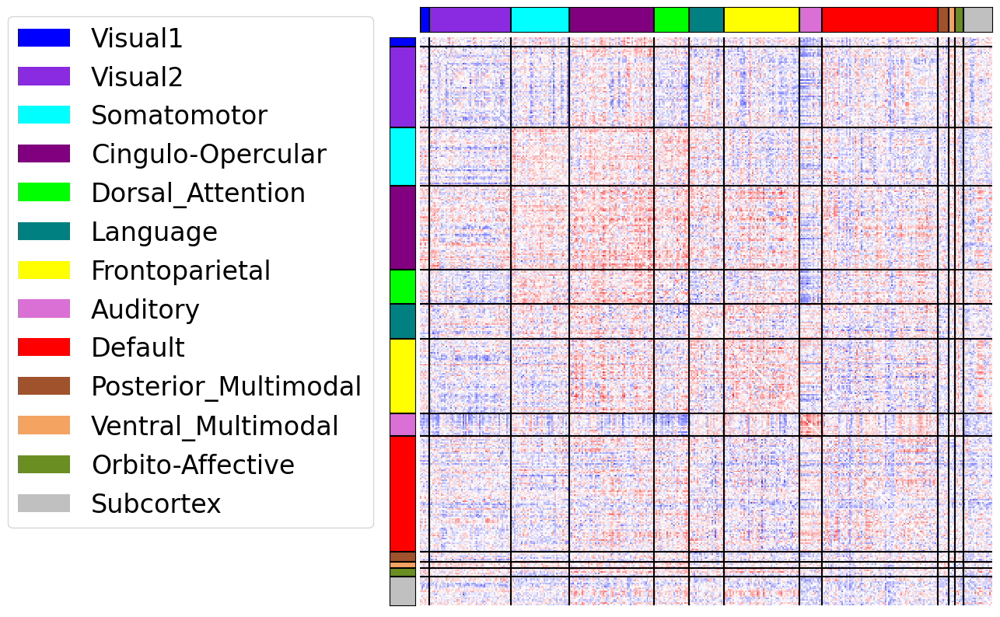

mot_FC


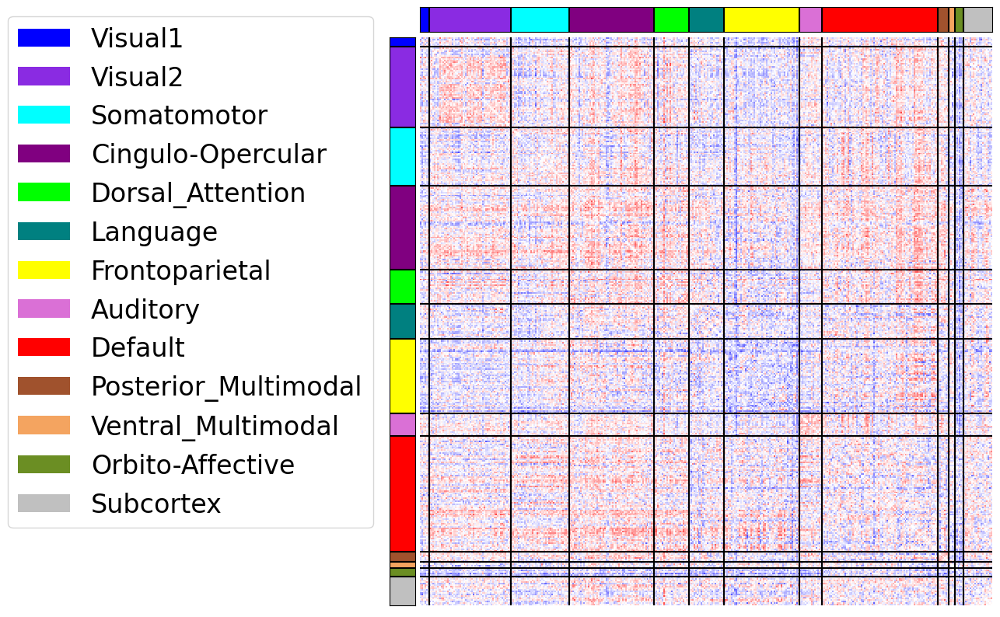

rel_FC


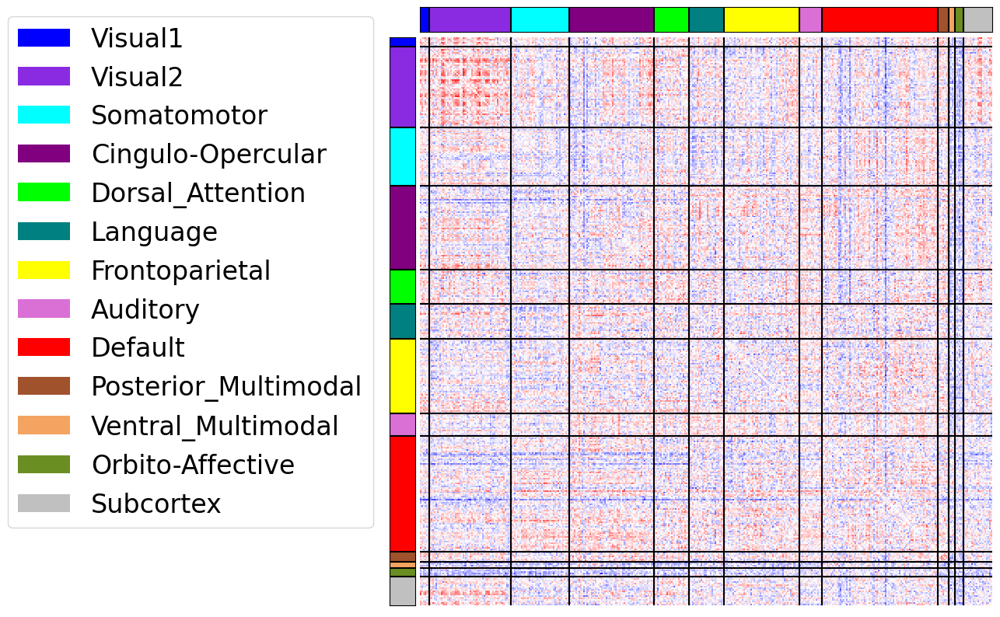

soc_FC


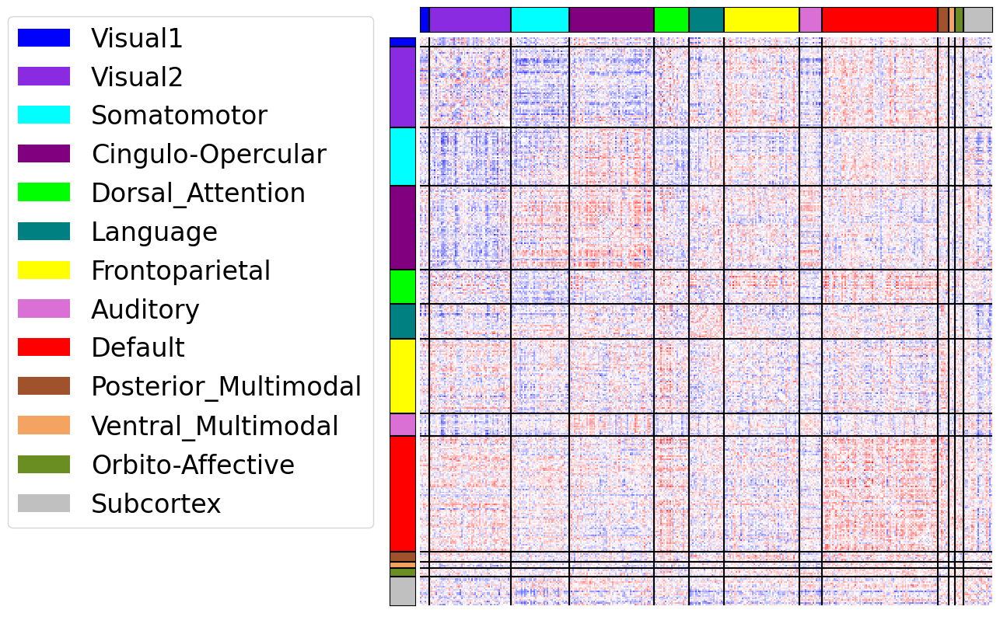

wm_FC


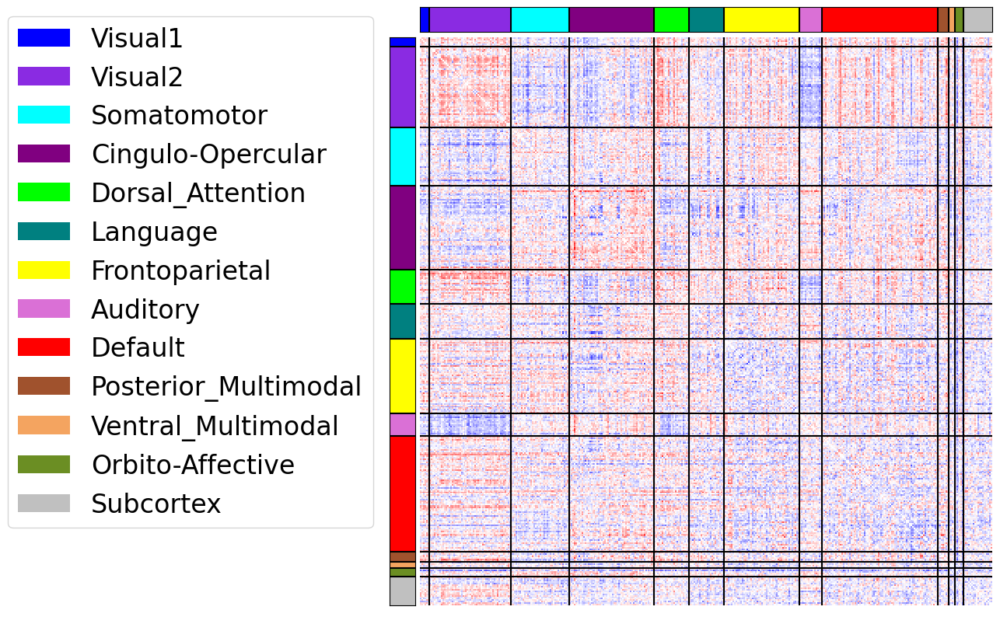

In [39]:
for key in ['rest', 'gam_FC', 'lan_FC', 'mot_FC', 'rel_FC', 'soc_FC', 'wm_FC']:
    print(key)
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values

    data = dct_FC_mat[key].reindex(index=indx, columns=indx)


    fig= plt.figure(figsize=(10,10))

    ax1 = plt.subplot2grid((20, 20), (0, 1), colspan=19) #x, horizontal
    ax2 = plt.subplot2grid((20, 20), (1, 0), rowspan=19) #y, vertical
    ax3 = plt.subplot2grid((20, 20), (1, 1), rowspan=19, colspan=19, sharex=ax1, sharey=ax2)


    vec = []
    vec_nms = []
    k=0
    for i in sorted(set(glanets['Cole_net_order'])):
        #print(i)
        display()
        k+= int(len(glanets[glanets['Cole_net_order']==i].index))
        vec+=[k]
        nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
        vec_nms+= [nms]


    for k in vec[:-1]:
        ax1.axvline(x=k, color='black')
        ax2.axhline(y=k, color='black')
        ax3.axvline(x=k, color='black')
        ax3.axhline(y=k, color='black')

    clrss = ['blue', 'blueviolet', 'cyan', 'purple', 'lime', 'teal', 'yellow', 'orchid', 'red', 'sienna', 'sandybrown', 'olivedrab', 'silver']    
    #clrss = clrss[::-1]
    lblss = vec_nms

    for n in range(len(vec)):
        if n==0:
            xmin=0
            xmax=vec[n]
        else:
            xmin=vec[n-1]
            xmax=vec[n]

        ax1.axvspan(xmin=xmin, xmax = xmax, ymax=1, facecolor=clrss[n], label=lblss[n])
        ax2.axhspan(ymin=xmin, ymax = xmax, xmax=1, facecolor=clrss[n])

    ax3 = sns.heatmap(data=data, cmap='bwr',vmin=-5, vmax=5,  cbar=False)#square=True,
    ax3.set_xticks([])
    ax3.set_yticks([])   

    ax1.set_ylim((0,0.5))
    ax2.set_xlim((0,0.5))
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax2.set_xticks([])
    ax2.set_yticks([])

    fig.legend(bbox_to_anchor=(0.12,0.885), fontsize=24)
    #ax2.legend(sns.color_palette('inferno', as_cmap=True))
    #fig.colorbar(sns.color_palette('inferno', as_cmap=True))
    #fig.colorbar(cm.ScalarMappable(cmap='inferno'), ax=axs[10:12])

    plt.savefig(path_img_out+'FI2_Brain_NoAdj_FCs_'+key+'_2_plot_image.png',bbox_inches='tight')

    plt.show()

In [40]:
#mean feature importance for Cole nets within each FC modality

for key in ['rest', 'gam_FC', 'lan_FC', 'mot_FC', 'rel_FC', 'soc_FC', 'wm_FC']:
    print(key)
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values

    data = dct_FC_mat[key].reindex(index=indx, columns=indx)
    
    net_icc = {}
    for i in sorted(set(glanets['Cole_net_name'])):
        indxs = glanets[glanets['Cole_net_name']==i]['name_Glasser'].values
        df= data.reindex(index=indxs, columns=indxs)
        df = df.where(np.triu(np.ones(df.shape)).astype(np.bool))
        df = df.stack().reset_index()
        df.columns = ['Row','Column','Value']
        net_icc[i] = df['Value'].mean()
    net_icc = pd.Series(net_icc)
    #print(key)
    display(net_icc.sort_values(ascending=False))

rest


Somatomotor             0.616134
Visual2                 0.418523
Subcortex               0.207507
Orbito-Affective        0.204230
Dorsal_Attention        0.117574
Posterior_Multimodal    0.076269
Auditory               -0.155908
Frontoparietal         -0.184093
Cingulo-Opercular      -0.214833
Visual1                -0.237937
Language               -0.322326
Default                -0.537350
Ventral_Multimodal     -0.947120
dtype: float64

gam_FC


Visual1                 1.349161
Visual2                 0.976980
Auditory                0.888003
Dorsal_Attention        0.419376
Subcortex               0.119020
Somatomotor             0.048916
Cingulo-Opercular       0.025608
Default                -0.136577
Frontoparietal         -0.300448
Orbito-Affective       -0.342912
Language               -0.369889
Posterior_Multimodal   -0.416029
Ventral_Multimodal     -0.593813
dtype: float64

lan_FC


Auditory                1.584728
Cingulo-Opercular       0.722810
Frontoparietal          0.559374
Somatomotor             0.412404
Language                0.249656
Dorsal_Attention        0.118235
Default                -0.002227
Posterior_Multimodal   -0.149155
Subcortex              -0.282355
Orbito-Affective       -0.359726
Visual2                -0.368604
Visual1                -0.424168
Ventral_Multimodal     -0.506710
dtype: float64

mot_FC


Posterior_Multimodal    1.120349
Auditory                0.949637
Dorsal_Attention        0.514750
Visual2                 0.434093
Cingulo-Opercular       0.429990
Somatomotor             0.077147
Default                -0.020945
Subcortex              -0.089816
Language               -0.158723
Visual1                -0.221955
Ventral_Multimodal     -0.324669
Frontoparietal         -0.705519
Orbito-Affective       -0.985042
dtype: float64

rel_FC


Visual1                 1.009320
Posterior_Multimodal    0.974905
Visual2                 0.801144
Dorsal_Attention        0.489775
Auditory                0.180384
Default                 0.076434
Cingulo-Opercular      -0.012062
Language               -0.032503
Frontoparietal         -0.122296
Somatomotor            -0.218029
Subcortex              -0.370278
Orbito-Affective       -0.891715
Ventral_Multimodal     -1.038365
dtype: float64

soc_FC


Default                 0.636668
Orbito-Affective        0.539263
Cingulo-Opercular       0.514907
Language                0.480158
Auditory                0.360297
Subcortex               0.217903
Posterior_Multimodal    0.200840
Visual1                 0.198184
Dorsal_Attention        0.119067
Visual2                -0.107141
Frontoparietal         -0.136946
Ventral_Multimodal     -0.297926
Somatomotor            -0.443086
dtype: float64

wm_FC


Visual2                 0.753817
Visual1                 0.745001
Dorsal_Attention        0.499840
Cingulo-Opercular       0.418675
Posterior_Multimodal    0.313478
Auditory                0.215534
Somatomotor             0.035007
Language               -0.153343
Default                -0.185157
Ventral_Multimodal     -0.325682
Subcortex              -0.340880
Frontoparietal         -0.372518
Orbito-Affective       -0.618267
dtype: float64